<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Project Title: Football Instance Segmentation CV Project (YOLO8) > Classes (4)</p></b></h1
    
### Table of contents:

* [Dowenloading Dataset](#1)
* [IMPORTING LIBRARIES](#2)
* [Loading Model YOLOV8](#3)
* [Training Model in Custom Dataset](#4)
* [Evaluation](#5)
* [Show Results](#6)
* [Test Model](#7)
* [Like this? Upvote and comment! 🌊 End](#8)
    

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Dowenloading Dataset</p></b></h1>

In [1]:
!pip install roboflow
!pip install ultralytics
from roboflow import Roboflow
rf = Roboflow(api_key="EJVfU57oVVqyNxwLK3Tx")
project = rf.workspace("vaprojet").project("football-aupvw")
version = project.version(4)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.8/871.8 kB 22.0 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.90, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to football-4 in yolov8:: 100%|██████████| 1768/1768 [00:00<00:00, 6298.21it/s]


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">IMPORTING LIBRARIES</p></b></h1>

In [2]:
import os
import pandas as pd
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import wandb
wandb.init(mode="disabled")

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Loading Model YOLOV8</p></b></h1>

In [3]:
model = YOLO('yolov8s-seg.pt')

100%|██████████| 22.8M/22.8M [00:00<00:00, 117MB/s] 


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Training Model in Custom Dataset</p></b></h1>

In [4]:
# Train the model using your dataset
results = model.train(
    data='/kaggle/input/your-data/data (2).yaml',  # Path to the dataset configuration file
    epochs=100,         # Number of training epochs
    imgsz=640,         # Image size for training
    batch=16,          # Batch size
    workers=4          # Number of data loading workers
)

Ultralytics YOLOv8.2.90 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/input/your-data/data (2).yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

100%|██████████| 755k/755k [00:00<00:00, 23.3MB/s]
2024-09-09 21:36:56,750	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-09-09 21:36:57,450	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 94.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/football-4/train/labels... 617 images, 0 backgrounds, 0 corrupt: 100%|██████████| 617/617 [00:00<00:00, 742.11it/s]

train: WARNING ⚠️ /kaggle/working/football-4/train/images/yt-98G2Bo0DhUs-0070_jpg.rf.7cc0d14bdfb896de6ee9179859824ca1.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/football-4/train/images/yt-98G2Bo0DhUs-0081_jpg.rf.4cb1a22cbcaaf0a4bfcd5ad22bfe853e.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/football-4/train/images/yt-Cbij3MKhdOY-0122_jpg.rf.8a813d902281093352663edcb40b9eec.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/football-4/train/images/yt-Cbij3MKhdOY-0122_jpg.rf.f1eea0193890397bf8030f7fff4a9e63.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/football-4/train/images/yt-Cbij3MKhdOY-0176_jpg.rf.d24a25595b668ee3f2f7002e59b74c20.jpg: 1 duplicate labels removed
train: New cache created: /kaggle/working/football-4/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/football-4/valid/labels... 172 images, 0 backgrounds, 0 corrupt: 100%|██████████| 172/172 [00:00<00:00, 354.33it/s]

val: WARNING ⚠️ /kaggle/working/football-4/valid/images/00000237_jpg.rf.6c47ddb95590e8e404bb3c7baab5ff28.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-98G2Bo0DhUs-0010_jpg.rf.39834fdb2f08977f297d5c7017a0213d.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-Cbij3MKhdOY-0122_jpg.rf.180f542e497a3b176abb4f1e8357ed9e.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-Cbij3MKhdOY-0176_jpg.rf.b6a73000e63f4a3dd0f70b4106fab775.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-Cbij3MKhdOY-0176_jpg.rf.ba3a99df2ca183712b708101c8e51056.jpg: 1 duplicate labels removed
val: New cache created: /kaggle/working/football-4/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.67G      1.231      2.356      1.742      1.019         69        640: 100%|██████████| 39/39 [00:31<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]


                   all        172       1735       0.44      0.446      0.406      0.272      0.423      0.424      0.378      0.199

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.56G      1.076      2.068       1.11     0.9826        155        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]


                   all        172       1735      0.611       0.59      0.567       0.36      0.579      0.544      0.511      0.256

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.52G      1.086      2.056      1.034     0.9882        218        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]


                   all        172       1735      0.531      0.499      0.495      0.334      0.493      0.475      0.435      0.221

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.45G      1.125      2.044     0.9853     0.9984        148        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.90it/s]


                   all        172       1735      0.601      0.591       0.56      0.364      0.594      0.522      0.499      0.244

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.49G      1.045      2.019     0.9268     0.9757        195        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]


                   all        172       1735      0.628      0.663      0.658      0.445      0.587      0.623        0.6      0.317

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.48G      1.019      1.964     0.8992     0.9698        170        640: 100%|██████████| 39/39 [00:25<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]


                   all        172       1735      0.669      0.663      0.707      0.474      0.695      0.554      0.614      0.297

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.54G     0.9994      1.947     0.8664     0.9558        108        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]


                   all        172       1735      0.785      0.643      0.711      0.482      0.725      0.612      0.626      0.326

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.48G     0.9565      1.898     0.8052     0.9523        110        640: 100%|██████████| 39/39 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]


                   all        172       1735      0.642      0.676      0.713      0.489      0.601      0.643       0.64      0.314

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.41G     0.9576      1.907     0.8095     0.9475         93        640: 100%|██████████| 39/39 [00:27<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]


                   all        172       1735      0.783      0.646      0.715      0.497      0.747      0.617       0.66       0.36

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.62G     0.9412      1.844     0.7902     0.9454        124        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]


                   all        172       1735       0.81      0.718      0.771      0.538      0.747      0.685      0.696      0.368

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.41G      0.928      1.886     0.7747     0.9497         81        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]


                   all        172       1735      0.762      0.655      0.726        0.5      0.678      0.587      0.628      0.311

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.49G     0.9049      1.902     0.7503     0.9438         76        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.24it/s]


                   all        172       1735      0.749      0.717      0.746      0.532      0.703       0.67      0.671      0.374

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.51G     0.9152      1.836     0.7433     0.9332        112        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]


                   all        172       1735      0.823      0.697      0.757      0.525      0.778      0.637      0.655      0.329

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.52G     0.8802      1.829     0.7082     0.9249        156        640: 100%|██████████| 39/39 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]


                   all        172       1735      0.771      0.708      0.751      0.535      0.711      0.665      0.679      0.354

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.57G     0.8699      1.836     0.6864     0.9187        182        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]

                   all        172       1735      0.783      0.715      0.754      0.544      0.702       0.66      0.673      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.47G     0.8865      1.763     0.6946     0.9269        114        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]


                   all        172       1735      0.802      0.723      0.774      0.559      0.735      0.672      0.699      0.385

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.54G     0.8754      1.785     0.6902     0.9226        152        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        172       1735      0.752      0.734      0.751      0.549      0.684      0.671      0.661      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.44G      0.866      1.761     0.6681     0.9232        170        640: 100%|██████████| 39/39 [00:24<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]


                   all        172       1735      0.809      0.738      0.765      0.566       0.76      0.671      0.688      0.393

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.52G     0.8469      1.743      0.646       0.91        112        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]

                   all        172       1735      0.812      0.732      0.767      0.582      0.757      0.675      0.702      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.44G     0.8349      1.733     0.6563       0.91        178        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]


                   all        172       1735      0.809      0.726      0.776      0.566      0.731      0.662      0.676      0.356

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.33G     0.8425      1.766     0.6621      0.914        107        640: 100%|██████████| 39/39 [00:25<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.92it/s]


                   all        172       1735      0.721      0.761      0.757       0.54      0.712      0.658      0.675      0.361

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.55G     0.8289      1.708     0.6446      0.912        156        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]


                   all        172       1735       0.74      0.712      0.751      0.553      0.774      0.628       0.69      0.369

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100       5.6G     0.8646      1.744     0.6755     0.9285         81        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]


                   all        172       1735      0.735      0.744      0.761      0.557      0.682      0.693      0.674      0.364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.64G     0.8335      1.729     0.6376      0.907        124        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        172       1735      0.842      0.739      0.797      0.588      0.783      0.681      0.715      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.51G     0.8241      1.664     0.6145     0.8994        110        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]

                   all        172       1735      0.821      0.762      0.812      0.605      0.748        0.7      0.709      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.51G     0.8052      1.683     0.6038     0.8969        132        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        172       1735      0.869       0.74      0.825       0.61      0.798      0.687      0.729        0.4



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.55G     0.8183      1.668     0.6163     0.9019         93        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]


                   all        172       1735      0.841      0.784      0.832      0.617       0.76      0.708      0.722      0.392

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.47G     0.8016      1.661        0.6     0.9021        133        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]

                   all        172       1735      0.816      0.752      0.822      0.616      0.709      0.716      0.733       0.41



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.62G     0.7894      1.668     0.5998     0.9001        138        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]


                   all        172       1735      0.822      0.766       0.82      0.606       0.79      0.732      0.757      0.411

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.61G     0.8112       1.67     0.6025     0.8963        122        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]


                   all        172       1735      0.844      0.753      0.805      0.599      0.791        0.7      0.733      0.394

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.47G     0.7882      1.633     0.5965     0.9005        149        640: 100%|██████████| 39/39 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        172       1735      0.803      0.754      0.823      0.626      0.797       0.67      0.747      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100       5.5G     0.8022      1.674     0.6011     0.8917        103        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]

                   all        172       1735      0.814      0.783      0.829      0.619      0.742       0.72      0.744      0.425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.47G     0.8125      1.674      0.599     0.8982        124        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        172       1735       0.88      0.775      0.846       0.64      0.831      0.703      0.755      0.435



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.51G     0.7785      1.631     0.5719     0.8918        107        640: 100%|██████████| 39/39 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        172       1735      0.849      0.781      0.836      0.628      0.769       0.71      0.725      0.404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.54G     0.7783      1.616     0.5601     0.8891        116        640: 100%|██████████| 39/39 [00:25<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.902      0.783      0.855      0.653      0.817      0.715      0.763      0.429



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100       5.5G     0.7487      1.617     0.5477     0.8841         95        640: 100%|██████████| 39/39 [00:25<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]

                   all        172       1735       0.88      0.768      0.856      0.648       0.82      0.715      0.779      0.439



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.51G     0.7637      1.605     0.5521     0.8823        114        640: 100%|██████████| 39/39 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]

                   all        172       1735      0.838      0.809       0.85      0.631      0.759      0.742      0.748      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.55G     0.7652       1.61     0.5457     0.8895        118        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        172       1735      0.883      0.778      0.853      0.648      0.828      0.707      0.753      0.415



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.49G     0.7561      1.595     0.5503     0.8914         96        640: 100%|██████████| 39/39 [00:25<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.22it/s]

                   all        172       1735       0.85        0.8      0.852      0.648      0.778       0.73       0.76      0.423



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.57G     0.7577      1.596     0.5432     0.8828        113        640: 100%|██████████| 39/39 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.826      0.793       0.84      0.633       0.77       0.73      0.759      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.48G     0.7442      1.602     0.5472     0.8801         90        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.30it/s]

                   all        172       1735      0.866      0.759      0.844      0.644      0.801      0.694      0.749      0.409



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.69G     0.7577       1.58     0.5495     0.8773        148        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.878      0.769       0.84      0.644      0.803      0.707      0.743      0.411



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.52G     0.7329      1.556      0.529      0.873        161        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        172       1735       0.86      0.801      0.861      0.655      0.786      0.729      0.762      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.59G     0.7391      1.599     0.5289      0.877        146        640: 100%|██████████| 39/39 [00:24<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        172       1735      0.864      0.828      0.861      0.655      0.788      0.759      0.766      0.419



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.64G     0.7423      1.547     0.5231     0.8782        154        640: 100%|██████████| 39/39 [00:25<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        172       1735      0.848      0.837      0.863      0.662      0.774      0.771      0.766      0.442



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.55G     0.7308      1.573     0.5224     0.8769         72        640: 100%|██████████| 39/39 [00:25<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.14it/s]

                   all        172       1735      0.854      0.814      0.867      0.664      0.786      0.749      0.776      0.436



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.65G     0.7379      1.557     0.5199     0.8797        138        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.19it/s]

                   all        172       1735      0.862      0.809       0.88      0.673      0.811      0.741      0.777      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.49G     0.7386      1.493     0.5102     0.8717        133        640: 100%|██████████| 39/39 [00:24<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        172       1735      0.828       0.84      0.875      0.668      0.812      0.738      0.792      0.446



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.68G     0.7321      1.517     0.5077     0.8686        205        640: 100%|██████████| 39/39 [00:26<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        172       1735      0.855      0.827      0.884      0.686      0.849      0.719      0.791      0.454



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.39G      0.695      1.511     0.4893     0.8651        101        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        172       1735      0.889      0.804      0.885      0.678      0.844      0.722      0.783      0.428



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.62G      0.712      1.503     0.4987     0.8679        144        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        172       1735       0.83      0.819      0.869      0.667      0.803       0.75       0.79      0.461



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.51G     0.7182      1.527     0.4976     0.8683         68        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]

                   all        172       1735       0.88      0.816      0.882      0.688       0.82      0.755      0.796      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.48G     0.7102      1.494     0.4939     0.8691        141        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]


                   all        172       1735      0.886      0.808      0.885      0.691      0.829      0.745       0.79       0.45

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.58G     0.6883      1.487      0.481     0.8587        160        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        172       1735      0.849      0.857      0.879      0.684      0.783      0.767      0.778      0.442



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.35G     0.7046      1.492     0.4911     0.8642        172        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.872      0.804      0.867      0.674      0.795      0.737      0.774      0.444



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.46G     0.6918      1.491     0.4845     0.8635         98        640: 100%|██████████| 39/39 [00:25<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.97it/s]

                   all        172       1735      0.843      0.829      0.861      0.667      0.779      0.774      0.768      0.428



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.66G     0.7146        1.5      0.503     0.8635        158        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

                   all        172       1735      0.842      0.839      0.881      0.689      0.781       0.78      0.793      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.54G     0.6798      1.466     0.4699     0.8648        117        640: 100%|██████████| 39/39 [00:25<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        172       1735      0.886      0.838      0.903      0.702       0.84      0.749        0.8      0.459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.57G     0.6872      1.468     0.4712     0.8631        181        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.24it/s]

                   all        172       1735      0.886      0.822      0.882      0.695      0.799      0.757      0.786      0.464



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.46G      0.681      1.486      0.475     0.8644         97        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]


                   all        172       1735      0.913      0.828      0.898      0.698       0.84      0.763      0.793      0.463

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.62G     0.6691      1.472     0.4628     0.8586        105        640: 100%|██████████| 39/39 [00:26<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]

                   all        172       1735      0.892      0.844      0.897      0.698      0.817      0.764      0.794      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.34G     0.6653      1.481     0.4606     0.8561         86        640: 100%|██████████| 39/39 [00:27<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        172       1735       0.88      0.837      0.896      0.695      0.835      0.742      0.796      0.455



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.35G     0.6857      1.474     0.4701     0.8626        135        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]

                   all        172       1735      0.885      0.844      0.901       0.71      0.817      0.769      0.797      0.461



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.55G     0.6756      1.454     0.4582     0.8545        102        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]

                   all        172       1735      0.878      0.855      0.903      0.715      0.856      0.733      0.797      0.466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.48G     0.6666      1.447     0.4579     0.8558        194        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.24it/s]

                   all        172       1735      0.901      0.826      0.893      0.707      0.813       0.77      0.798      0.458



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.63G     0.6543      1.444       0.45      0.855         94        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]

                   all        172       1735      0.866      0.864      0.902      0.713        0.8      0.795      0.807      0.464



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100       5.5G     0.6776      1.417      0.458     0.8533        121        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]

                   all        172       1735      0.873      0.865      0.895      0.702        0.8      0.791       0.79      0.462



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.52G     0.6652      1.417     0.4516     0.8534        169        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        172       1735      0.847      0.864      0.896      0.718      0.823      0.751      0.799      0.478



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.45G     0.6642      1.422     0.4428     0.8516        143        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.19it/s]

                   all        172       1735      0.891       0.83      0.897      0.708      0.845      0.744      0.788      0.455



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.51G     0.6489      1.413     0.4349     0.8526        183        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.18it/s]

                   all        172       1735      0.882      0.861      0.901      0.713      0.818      0.786      0.809      0.474



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.58G     0.6486      1.421     0.4405     0.8484        119        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]

                   all        172       1735      0.877      0.842        0.9      0.715      0.853      0.751      0.804      0.483



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.49G     0.6407      1.411      0.434     0.8512        136        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]

                   all        172       1735      0.895       0.84      0.894      0.723      0.831       0.78      0.801      0.471



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.47G     0.6457      1.399     0.4342     0.8487        108        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.923      0.832      0.904      0.722      0.856      0.766      0.809      0.479



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.45G     0.6432      1.405     0.4279     0.8509         93        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.919      0.838      0.909      0.722      0.859      0.774      0.808      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.56G     0.6431      1.393     0.4336      0.854        200        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]

                   all        172       1735       0.93      0.838      0.908      0.725      0.852       0.77        0.8       0.47



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100       5.5G     0.6362      1.426     0.4247     0.8484         91        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]

                   all        172       1735      0.919      0.849      0.918      0.727      0.854       0.78      0.813      0.469



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.57G     0.6253      1.367     0.4177     0.8487         72        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.899      0.866      0.915      0.729       0.83      0.792      0.817      0.469



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.64G     0.6315      1.394      0.421     0.8436        147        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        172       1735      0.913      0.855      0.907      0.724      0.841      0.793      0.809       0.49



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.64G     0.6254      1.362     0.4193     0.8422         87        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]

                   all        172       1735      0.903      0.864      0.914      0.737      0.843      0.805      0.823      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.52G     0.6293      1.363       0.42     0.8497        141        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        172       1735      0.914      0.859      0.913      0.732      0.843      0.789      0.816      0.474



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.66G     0.6167      1.389     0.4121     0.8461        102        640: 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.28it/s]

                   all        172       1735      0.896      0.862      0.912      0.733      0.833      0.803      0.821      0.482



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.55G     0.6165      1.354     0.4142     0.8437        137        640: 100%|██████████| 39/39 [00:26<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        172       1735      0.923      0.854      0.908      0.728      0.847      0.779      0.808      0.476



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.64G      0.621      1.359     0.4141     0.8447        204        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]

                   all        172       1735      0.915      0.854       0.91      0.733      0.847       0.79      0.815      0.487



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100       5.4G     0.6021      1.339     0.4022     0.8382         80        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        172       1735      0.932      0.841      0.915      0.742      0.827      0.789      0.808      0.476



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.59G     0.6101      1.383     0.4039     0.8427        132        640: 100%|██████████| 39/39 [00:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.922      0.866      0.924      0.745      0.836      0.785      0.809      0.478



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.49G     0.6008      1.351     0.4054     0.8417        112        640: 100%|██████████| 39/39 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        172       1735      0.889      0.877      0.915      0.743      0.844      0.779      0.809      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.48G     0.5976      1.357     0.3954     0.8405        112        640: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        172       1735      0.917      0.854      0.916      0.745       0.84      0.794      0.822      0.492



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.51G     0.5899      1.338     0.3936     0.8411        174        640: 100%|██████████| 39/39 [00:27<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]

                   all        172       1735      0.916      0.844      0.913      0.746      0.853       0.79      0.828      0.492



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.51G     0.5974      1.352     0.3983     0.8378         61        640: 100%|██████████| 39/39 [00:26<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        172       1735      0.896      0.874      0.912      0.746      0.844       0.79      0.816      0.487



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.47G     0.6011      1.325     0.3941     0.8387        163        640: 100%|██████████| 39/39 [00:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]

                   all        172       1735      0.906      0.847      0.912       0.74       0.84      0.788      0.817      0.481


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.34G     0.5534      1.361     0.3693     0.8272         85        640: 100%|██████████| 39/39 [00:19<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.33it/s]

                   all        172       1735      0.906      0.856      0.904      0.735      0.839      0.793      0.811      0.472



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.44G     0.5391      1.336     0.3576     0.8263         81        640: 100%|██████████| 39/39 [00:16<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.32it/s]

                   all        172       1735      0.901      0.888      0.904      0.734      0.836      0.794      0.807      0.472



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.39G     0.5378       1.33     0.3531     0.8291         61        640: 100%|██████████| 39/39 [00:16<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.25it/s]

                   all        172       1735      0.883       0.89       0.91      0.745      0.843      0.795      0.809      0.477



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.42G     0.5519        1.3      0.358      0.829         76        640: 100%|██████████| 39/39 [00:16<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.33it/s]

                   all        172       1735      0.897      0.887      0.915      0.745      0.838        0.8      0.813      0.475



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100       5.4G     0.5431      1.328     0.3559      0.829         78        640: 100%|██████████| 39/39 [00:16<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]

                   all        172       1735       0.91      0.883      0.914      0.745      0.855      0.801      0.814      0.474



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.31G     0.5333      1.296      0.351     0.8237         52        640: 100%|██████████| 39/39 [00:16<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.33it/s]

                   all        172       1735      0.905      0.882      0.913      0.743      0.855      0.801      0.817      0.479



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.38G     0.5279      1.296     0.3456     0.8219        106        640: 100%|██████████| 39/39 [00:16<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]

                   all        172       1735      0.913      0.876      0.912      0.743      0.851      0.786       0.81      0.472



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.41G      0.515       1.28     0.3411     0.8216         80        640: 100%|██████████| 39/39 [00:16<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]

                   all        172       1735      0.907      0.892      0.916      0.749      0.867      0.787       0.82      0.489



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.45G     0.5237      1.262     0.3422     0.8245         99        640: 100%|██████████| 39/39 [00:16<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.37it/s]

                   all        172       1735      0.902      0.885      0.916      0.747      0.846      0.795      0.818      0.482



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.39G     0.5167      1.293     0.3396      0.823         78        640: 100%|██████████| 39/39 [00:16<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.36it/s]

                   all        172       1735      0.911      0.884      0.917      0.746      0.861      0.789      0.818      0.484



100 epochs completed in 0.819 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 23.9MB
Optimizer stripped from runs/segment/train/weights/best.pt, 23.9MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.2.90 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,781,148 parameters, 0 gradients, 42.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:09<00:00,  1.63s/it]


                   all        172       1735      0.917      0.843      0.913      0.745      0.854      0.787      0.828      0.493
                  ball        120        129      0.849      0.654      0.767      0.503      0.769      0.593       0.64      0.331
            goalkepper         54         58      0.907      0.862      0.955      0.821      0.852       0.81      0.868      0.549
                player        168       1410       0.95      0.959      0.979      0.859      0.917      0.926      0.949      0.579
               referee         98        138      0.964      0.899      0.953      0.799      0.876      0.819      0.856      0.511
Speed: 0.5ms preprocess, 8.7ms inference, 0.2ms loss, 3.7ms postprocess per image
Results saved to runs/segment/train


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Evaluation</p></b></h1>

In [5]:
evaluation = model.val(data='/kaggle/input/your-data/data (2).yaml')

Ultralytics YOLOv8.2.90 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,781,148 parameters, 0 gradients, 42.4 GFLOPs


val: Scanning /kaggle/working/football-4/valid/labels.cache... 172 images, 0 backgrounds, 0 corrupt: 100%|██████████| 172/172 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/football-4/valid/images/00000237_jpg.rf.6c47ddb95590e8e404bb3c7baab5ff28.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-98G2Bo0DhUs-0010_jpg.rf.39834fdb2f08977f297d5c7017a0213d.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-Cbij3MKhdOY-0122_jpg.rf.180f542e497a3b176abb4f1e8357ed9e.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-Cbij3MKhdOY-0176_jpg.rf.b6a73000e63f4a3dd0f70b4106fab775.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/football-4/valid/images/yt-Cbij3MKhdOY-0176_jpg.rf.ba3a99df2ca183712b708101c8e51056.jpg: 1 duplicate labels removed



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.09it/s]


                   all        172       1735      0.917      0.844      0.914      0.743      0.841      0.774      0.811      0.467
                  ball        120        129      0.849      0.655      0.767        0.5      0.756      0.581      0.623       0.32
            goalkepper         54         58      0.906      0.862      0.955      0.814      0.834      0.793      0.843      0.513
                player        168       1410       0.95       0.96       0.98      0.858      0.915      0.924      0.946       0.56
               referee         98        138      0.961      0.899      0.953        0.8      0.859      0.797      0.833      0.476
Speed: 1.0ms preprocess, 9.9ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/segment/train2


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Show Results</p></b></h1>

In [6]:
def Show_Result(image_path):
    img = mpimg.imread(image_path)
    plt.style.use('dark_background')
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [7]:
pd.read_csv('/kaggle/working/runs/segment/train/results.csv')

,epoch,train/box_loss,train/seg_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),metrics/precision(M),metrics/recall(M),metrics/mAP50(M),metrics/mAP50-95(M),val/box_loss,val/seg_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.23130,2.3563,1.74220,1.01920,0.44000,0.44643,0.40571,0.27186,0.42347,0.42353,0.37778,0.19879,1.01530,1.9739,1.47560,0.97667,0.000406,0.000406,0.000406
1,2,1.07590,2.0684,1.11000,0.98256,0.61056,0.59018,0.56673,0.36041,0.57933,0.54405,0.51113,0.25557,1.08560,2.0331,1.39860,1.06280,0.000815,0.000815,0.000815
2,3,1.08620,2.0563,1.03390,0.98817,0.53081,0.49910,0.49451,0.33411,0.49262,0.47497,0.43519,0.22087,1.01150,2.0191,1.41550,1.02620,0.001215,0.001215,0.001215
3,4,1.12470,2.0445,0.98534,0.99838,0.60083,0.59073,0.55992,0.36366,0.59364,0.52155,0.49940,0.24407,1.02140,1.8734,1.36910,1.02010,0.001213,0.001213,0.001213
4,5,1.04520,2.0190,0.92684,0.97569,0.62791,0.66267,0.65785,0.44493,0.58728,0.62320,0.60025,0.31688,0.91325,1.8983,0.97899,0.97431,0.001200,0.001200,0.001200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,0.53328,1.2959,0.35095,0.82374,0.90478,0.88183,0.91347,0.74273,0.85480,0.80085,0.81744,0.47901,0.56337,1.5531,0.41401,0.85231,0.000074,0.000074,0.000074
96,97,0.52791,1.2962,0.34558,0.82186,0.91336,0.87633,0.91223,0.74315,0.85134,0.78641,0.80966,0.47238,0.56348,1.5417,0.41503,0.84945,0.000062,0.000062,0.000062
97,98,0.51496,1.2796,0.34106,0.82161,0.90688,0.89232,0.91570,0.74866,0.86711,0.78726,0.82016,0.48934,0.55329,1.5115,0.40977,0.84721,0.000050,0.000050,0.000050
98,99,0.52370,1.2617,0.34218,0.82453,0.90161,0.88511,0.91646,0.74654,0.84639,0.79526,0.81790,0.48239,0.55439,1.5519,0.40998,0.84685,0.000037,0.000037,0.000037


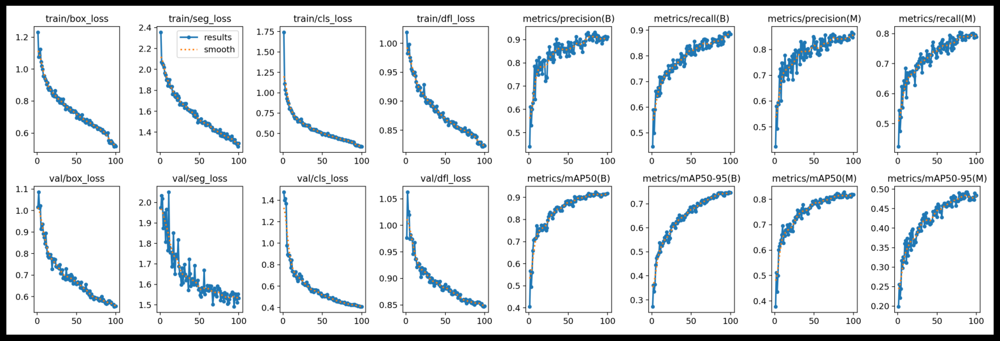

In [8]:
### Results
Show_Result('/kaggle/working/runs/segment/train/results.png')

In [9]:
path = os.path.join('/kaggle/working/runs/segment',os.listdir('/kaggle/working/runs/segment')[0])
path

'/kaggle/working/runs/segment/train2'

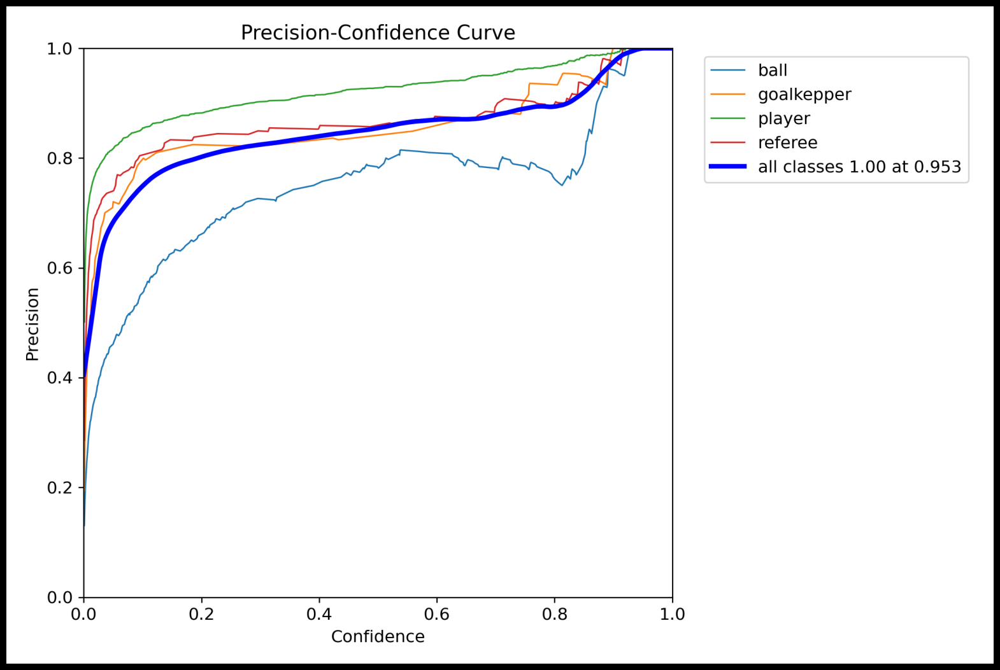

In [10]:
## Mask Precision
Show_Result(os.path.join(path,'MaskP_curve.png'))

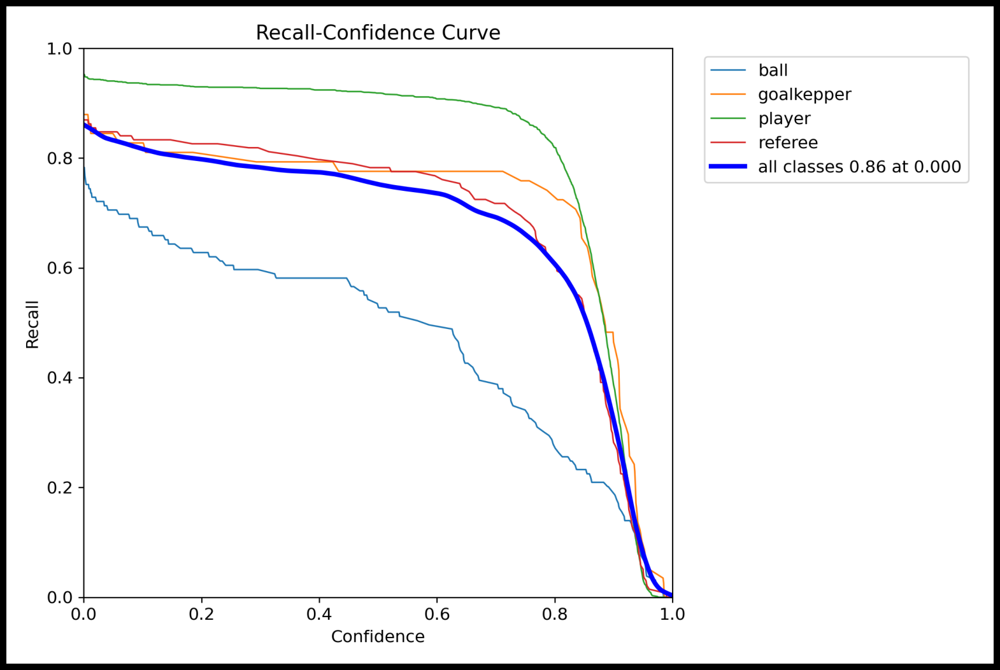

In [11]:
## Mask Recall
Show_Result(os.path.join(path,'MaskR_curve.png'))

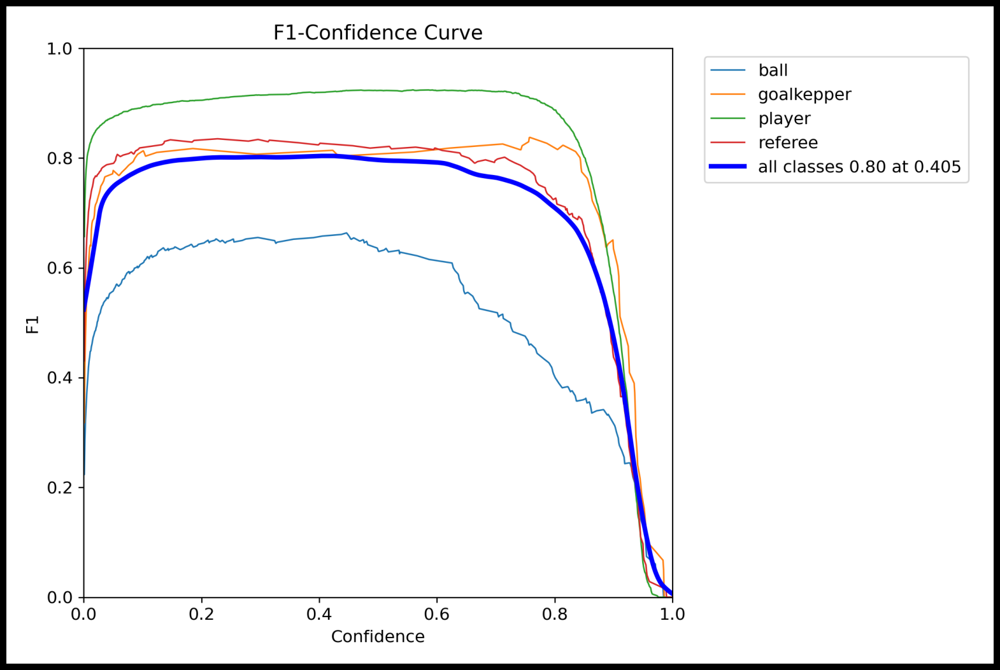

In [12]:
## Mask F1
Show_Result(os.path.join(path,'MaskF1_curve.png'))

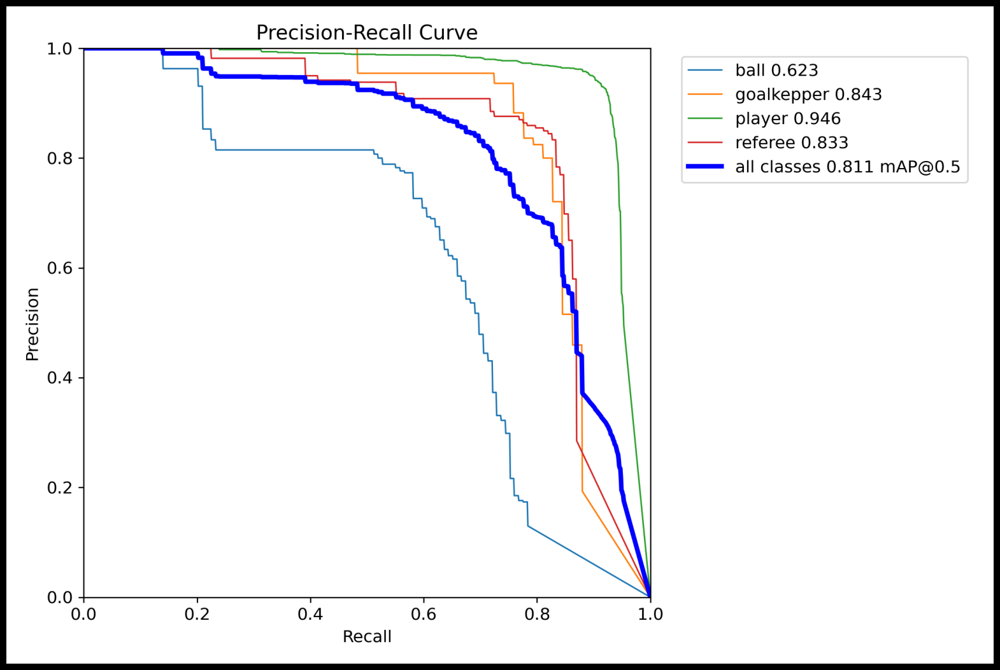

In [13]:
## Mask Precision-Recall
Show_Result(os.path.join(path,'MaskPR_curve.png'))

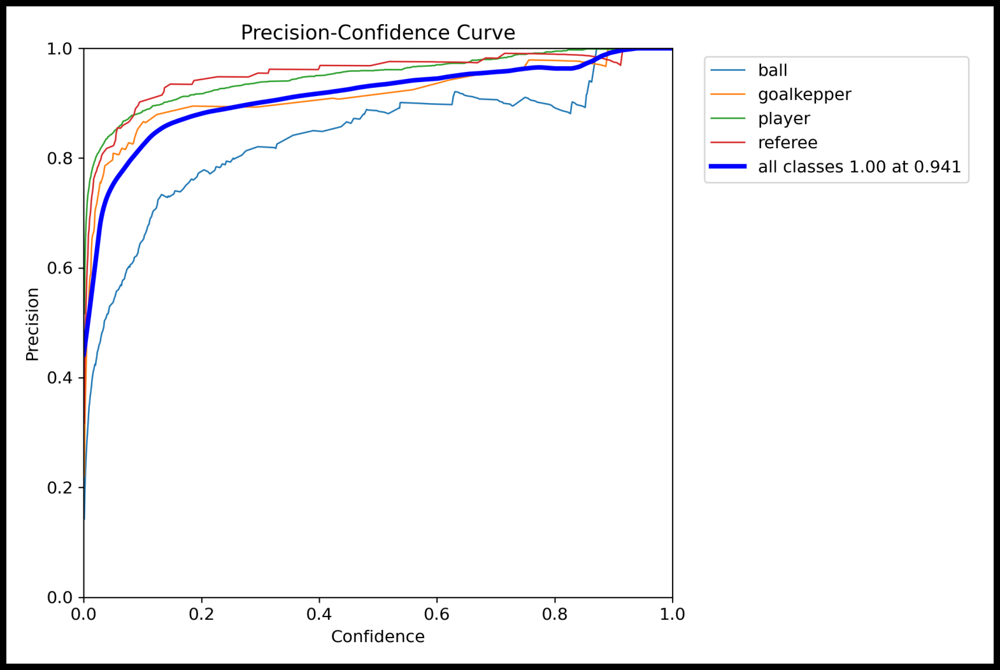

In [14]:
## Box Precision
Show_Result(os.path.join(path,'BoxP_curve.png'))

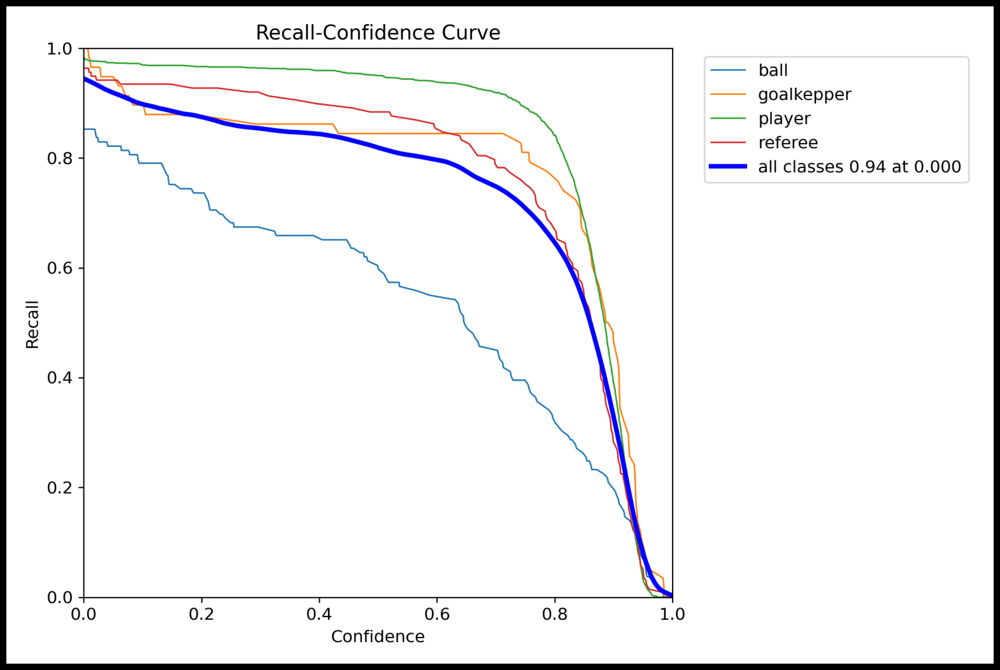

In [15]:
## Box Recall
Show_Result(os.path.join(path,'BoxR_curve.png'))

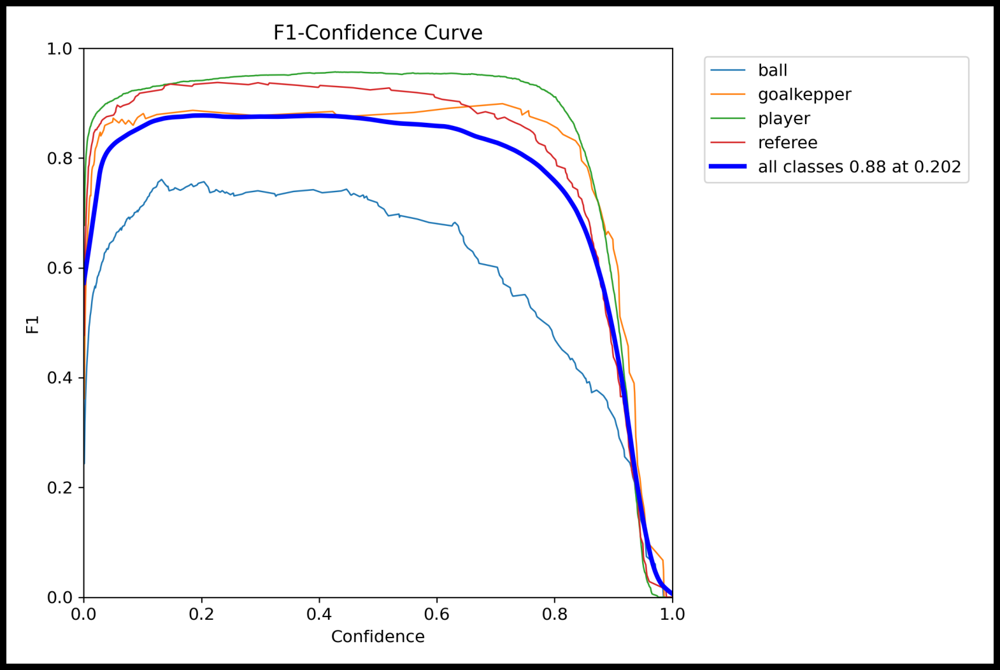

In [16]:
## Box F1
Show_Result(os.path.join(path,'BoxF1_curve.png'))

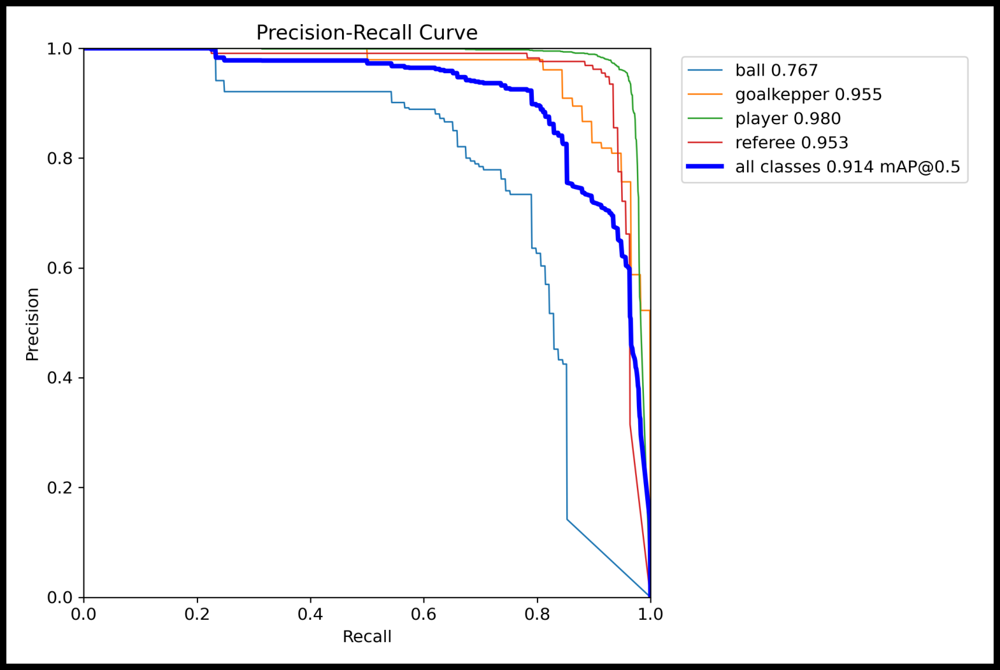

In [17]:
## Box Precision-Recall
Show_Result(os.path.join(path,'BoxPR_curve.png'))

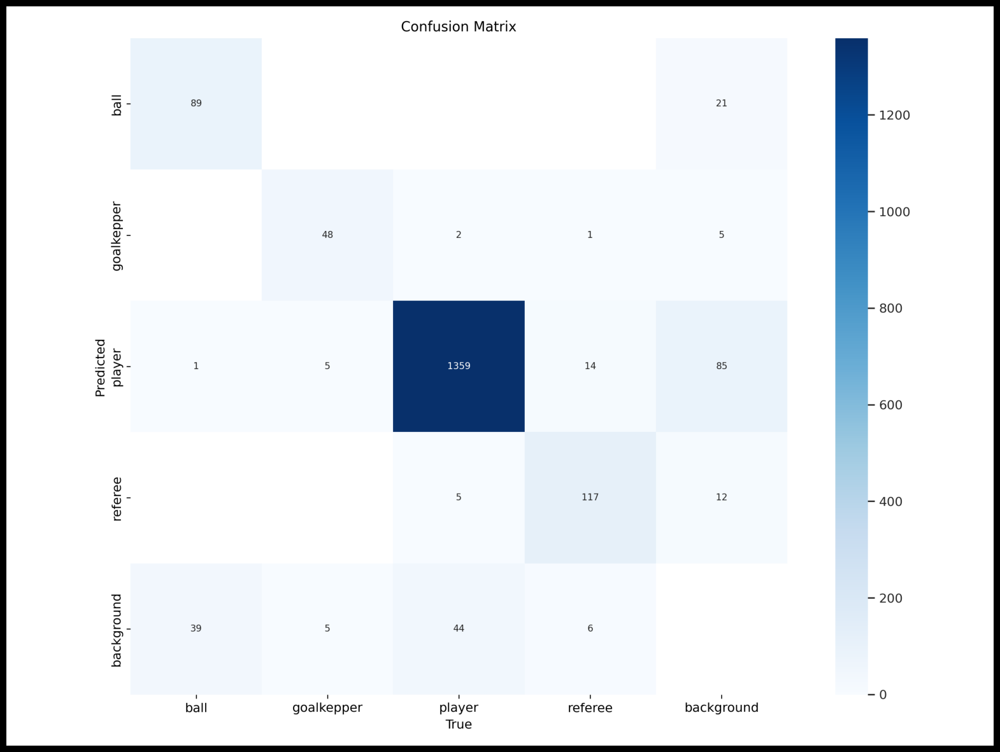

In [18]:
## Confusion Matrix
Show_Result(os.path.join(path,'confusion_matrix.png'))

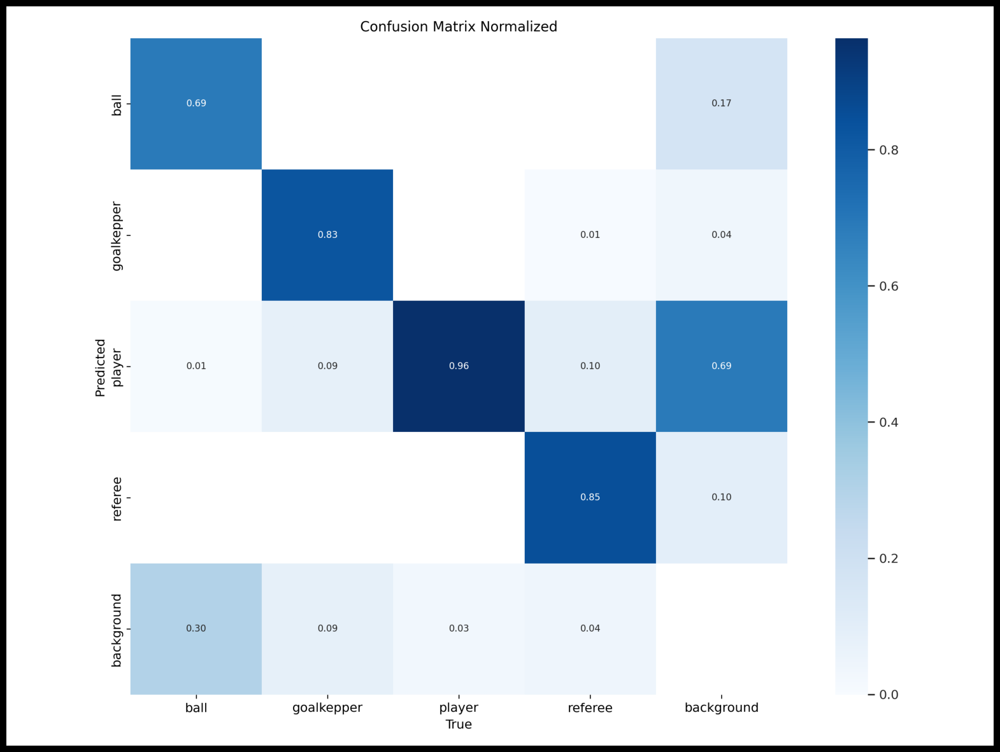

In [19]:
## Confusion Matrix Normalized
Show_Result(os.path.join(path,'confusion_matrix_normalized.png'))

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Test Model</p></b></h1>

In [20]:
# Run inference on images in the 'test' folder
results = model.predict(source='/kaggle/working/football-4/test/images', imgsz=640, conf=0.5,verbose=False)

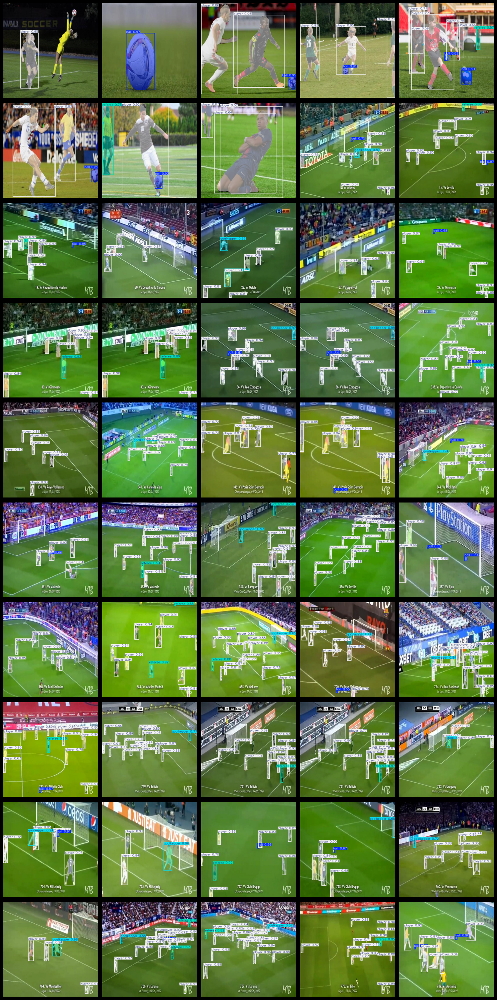

In [21]:
# Number of images to display
num_images = 50

# Set up the figure and grid
fig, axes = plt.subplots(10, 5, figsize=(15, 30))  # 10 rows and 5 columns

# Ensure there are enough images in the results
for i in range(min(num_images, len(results))):
    # Get the image with boxes drawn
    img_with_boxes = results[i].plot()  # This draws bounding boxes and labels on the image

    # Convert the image to RGB (matplotlib expects RGB, OpenCV uses BGR)
    img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)

    # Get the appropriate axis in the grid
    ax = axes[i // 5, i % 5]  # 5 columns
    ax.imshow(img_with_boxes)
    ax.axis('off')  # Hide the axes

# Adjust layout
plt.tight_layout()
plt.show()

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Like this? Upvote and comment! 🌊 End</p></b></h1>